In [1]:
import cv2
import json
import time
import random
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F

from tqdm import tqdm
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from transformers import Qwen2TokenizerFast, Qwen3ForCausalLM, AutoConfig

from diffusers.utils import load_image
from diffusers.schedulers import FlowMatchEulerDiscreteScheduler
from diffusers.models import AutoencoderKLFlux2, Flux2Transformer2DModel

from ctgmworkshop.flux_tools import *
from ctgmworkshop.image_tools import *

device = "cuda"
dtype = torch.bfloat16
plt.style.use("dark_background")

In [2]:
transformer = Flux2Transformer2DModel.from_pretrained(
    "../../FLUX.2-klein-4B/transformer", device=device
).to(device, dtype)
vae = AutoencoderKLFlux2.from_pretrained("../../FLUX.2-klein-4B/vae", device=device).to(
    device
)
scheduler = FlowMatchEulerDiscreteScheduler.from_pretrained(
    "../../FLUX.2-klein-4B/scheduler", device=device
)
text_encoder = Qwen3ForCausalLM.from_pretrained(
    "../../FLUX.2-klein-4B/text_encoder", local_files_only=True
).to(device, dtype)
tokenizer = Qwen2TokenizerFast.from_pretrained(
    "../../FLUX.2-klein-4B/tokenizer", local_files_only=True, device=device
)

vae_mean, vae_std = get_latents_mean_std(vae)

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

In [3]:
train_batch_size = 1
instruct_prompt = "Move textures from image2 on image1. "
height = 512
width = 960

In [4]:
class FlowRefractorDataset(Dataset):
    def __init__(self):
        with open("../../precomputes/flow_refractor/test-4/all_prompts.json", "r") as f:
            self.all_prompts = json.load(f)

        self.all_cond_latents_A = torch.load(
            "../../precomputes/flow_refractor/test-4/all_cond_latents_A.pt"
        )
        self.all_cond_latents_B = torch.load(
            "../../precomputes/flow_refractor/test-4/all_cond_latents_B.pt"
        )
        self.all_final_latents_A = torch.load(
            "../../precomputes/flow_refractor/test-4/all_final_latents_A.pt"
        )
        self.all_final_latents_B = torch.load(
            "../../precomputes/flow_refractor/test-4/all_final_latents_B.pt"
        )
        self.all_masked_latents_B = torch.load(
            "../../precomputes/flow_refractor/test-4/all_masked_latents_B.pt"
        )

    def __len__(self):
        return len(self.all_cond_latents_A)

    def __getitem__(self, idx):
        return (
            self.all_prompts[idx],
            self.all_cond_latents_A[idx],
            self.all_cond_latents_B[idx],
            self.all_final_latents_A[idx],
            self.all_final_latents_B[idx],
            self.all_masked_latents_B[idx],
        )

In [5]:
dataset = FlowRefractorDataset()

In [6]:
train_loader = DataLoader(dataset, batch_size=train_batch_size, shuffle=True)

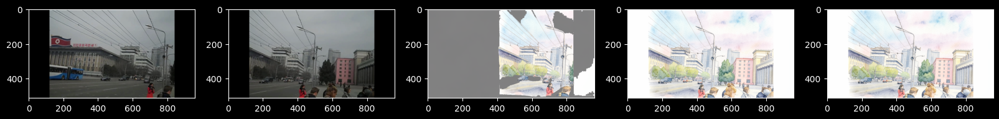

Turn this image into style of watercolor painting.


In [7]:
prompts, cond_A, cond_B, final_A, final_B, masked_B = next(iter(train_loader))

fig, ax = plt.subplots(1, 5, figsize=(20, 5))

for i, l in enumerate([cond_A, cond_B, final_A, final_B, masked_B]):
    with torch.no_grad():
        latents = denorm_unpatchified_latents(
            l[:1].cuda().float(), mean=vae_mean, std=vae_std
        )
        reconstructed = (vae.decode(latents[:1]).sample + 1.0) / 2.0

    reconstructed = reconstructed.squeeze(0).permute((1, 2, 0)).cpu().numpy()
    reconstructed = np.clip(reconstructed, 0, 1)

    ax[i].imshow(reconstructed)
plt.show()

print(prompts[0])

In [8]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt
import torch
from IPython.display import clear_output


def _get_next_sample_index(save_directory):
    """
    Finds the next available integer index for sample files
    of the form sample_<index>.png or sample_epochX_<index>.png.
    """
    pattern = re.compile(r"sample_(?:epoch\d+_)?(\d+)\.png")
    max_index = -1

    for fname in os.listdir(save_directory):
        match = pattern.match(fname)
        if match:
            max_index = max(max_index, int(match.group(1)))

    return max_index + 1


def latents_to_np(latent):
    img = denorm_unpatchified_latents(latent, mean=vae_mean, std=vae_std)
    img = decode_latents(img, vae)
    img = denorm_image(img)
    return torch_to_np(img)


def prepare_reference_latents(
    reference_latents: list[torch.Tensor],
    vae,
    batch_size,
    device,
    dtype,
):
    image_latents = []
    for l in reference_latents:
        image_latent = patchify_latents(l)
        image_latents.append(image_latent)  # (1, 128, 32, 32)

    image_latent_ids = prepare_image_ids(image_latents)

    # Pack each latent and concatenate
    packed_latents = []
    for latent in image_latents:
        # latent: (1, 128, 32, 32)
        packed = pack_latents(latent)  # (1, 1024, 128)
        packed = packed.squeeze(0)  # (1024, 128) - remove batch dim
        packed_latents.append(packed)

    # Concatenate all reference tokens along sequence dimension
    image_latents = torch.cat(packed_latents, dim=0)  # (N*1024, 128)
    image_latents = image_latents.unsqueeze(0)  # (1, N*1024, 128)

    image_latents = image_latents.repeat(batch_size, 1, 1)
    image_latent_ids = image_latent_ids.repeat(batch_size, 1, 1)
    image_latent_ids = image_latent_ids.to(device)

    return image_latents, image_latent_ids


@torch.no_grad()
def test_model():
    prompts, cond_A, cond_B, final_A, final_B, masked_B = next(iter(train_loader))

    cond_A = cond_A[:1].to(device, dtype)
    cond_B = cond_B[:1].to(device, dtype)
    final_A = final_A[:1].to(device, dtype)
    prompt = prompts[0]
    prompt = instruct_prompt + prompt

    prompt_embeds, text_ids = encode_prompt(
        prompt=prompt,
        text_encoder=text_encoder,
        tokenizer=tokenizer,
        device=device,
        num_images_per_prompt=1,
        max_sequence_length=512,
        text_encoder_out_layers=(9, 18, 27),
    )

    generator = torch.Generator(device="cuda")

    latents, latent_ids = prepare_latents(
        batch_size=1,
        num_latents_channels=32,
        height=height,
        width=width,
        dtype=dtype,
        device=device,
        generator=generator,
    )

    image_latents, image_latent_ids = prepare_reference_latents(
        reference_latents=[cond_B, final_A],
        vae=vae,
        batch_size=1,
        device=device,
        dtype=dtype,
    )

    num_inference_steps = 4

    sigmas = np.linspace(1.0, 1 / num_inference_steps, num_inference_steps)

    image_seq_len = latents.shape[1]

    mu = compute_empirical_mu(
        image_seq_len=image_seq_len, num_steps=num_inference_steps
    )

    timesteps, num_inference_steps = retrieve_timesteps(
        scheduler,
        num_inference_steps,
        device,
        sigmas=sigmas,
        mu=mu,
    )

    for i, t in enumerate(timesteps):
        timestep = t.expand(latents.shape[0]).to(latents.dtype)

        latent_model_input = latents.to(transformer.dtype)
        latent_image_ids = latent_ids

        noise_pred = transformer(
            hidden_states=torch.cat([latent_model_input, image_latents], dim=1),
            timestep=timestep / 1000,
            guidance=None,
            encoder_hidden_states=prompt_embeds,
            txt_ids=text_ids,
            img_ids=torch.cat([latent_image_ids, image_latent_ids], dim=1),
            return_dict=False,
        )[0]

        noise_pred = noise_pred[:, : latents.size(1), :]

        latents = scheduler.step(noise_pred, t, latents, return_dict=False)[0]

    latents = unpack_latents_with_ids(latents, latent_ids)
    latents = unpatchify_latents(latents)

    latents = [cond_A, cond_B, final_A, latents]
    cond_image_A, cond_image_B, final_image_A, generated = map(latents_to_np, latents)

    fig, axes = plt.subplots(1, 3, figsize=(32, 8))
    axes[0].imshow(cond_image_B)
    axes[0].set_title("1")

    # axes[1].imshow(cond_image_A)
    # axes[1].set_title("same way as image2")

    axes[1].imshow(final_image_A)
    axes[1].set_title("2")

    axes[2].imshow(generated)
    axes[2].set_title("Answer:")

    plt.show()

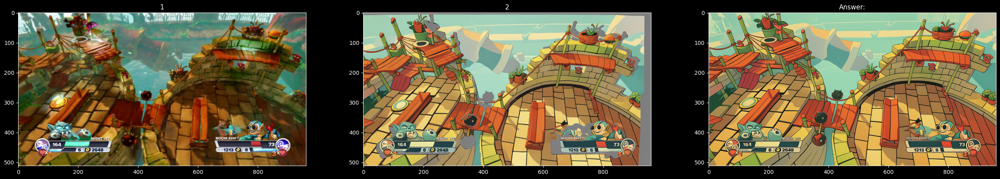

In [30]:
test_model()

In [13]:
from peft import LoraConfig

for p in transformer.parameters():
    p.requires_grad_(False)

In [14]:
lora_config = LoraConfig(
    r=16,
    lora_alpha=16,
    target_modules=[
        "to_q",
        "to_k",
        "to_v",
        "to_out.0",
    ],
    bias="none",
)

In [15]:
from peft import get_peft_model

transformer = get_peft_model(transformer, lora_config)

In [16]:
transformer.print_trainable_parameters()

trainable params: 1,966,080 || all params: 3,877,510,656 || trainable%: 0.0507


In [17]:
trainable_params = [p for p in transformer.parameters() if p.requires_grad]

optimizer = torch.optim.AdamW(trainable_params, lr=1e-4)
num_train_timesteps = 1000

# total_params = sum(p.numel() for p in transformer.parameters())
# print("Total params:", total_params / 1000000, "M")

  2%|▏         | 99/5000 [01:42<1:24:48,  1.04s/it]

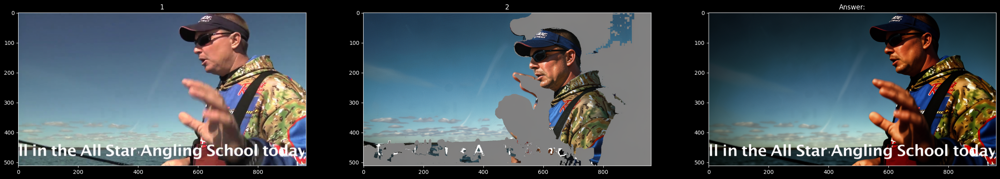

  4%|▍         | 199/5000 [03:27<1:21:54,  1.02s/it]

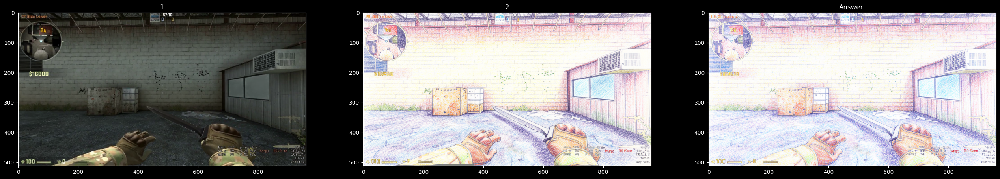

  6%|▌         | 299/5000 [05:13<1:21:23,  1.04s/it]

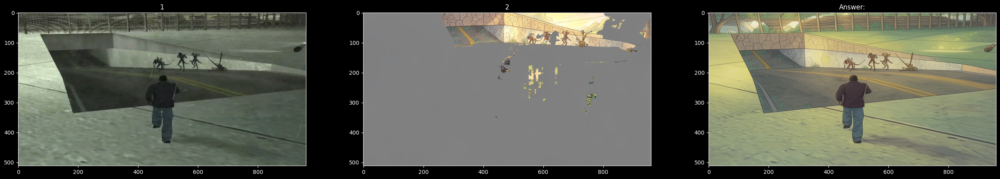

  8%|▊         | 399/5000 [06:59<1:19:57,  1.04s/it]

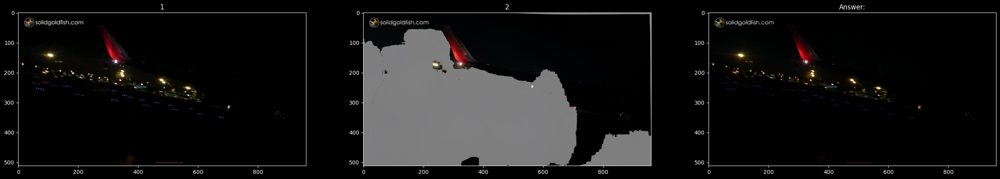

 10%|▉         | 499/5000 [08:45<1:18:13,  1.04s/it]

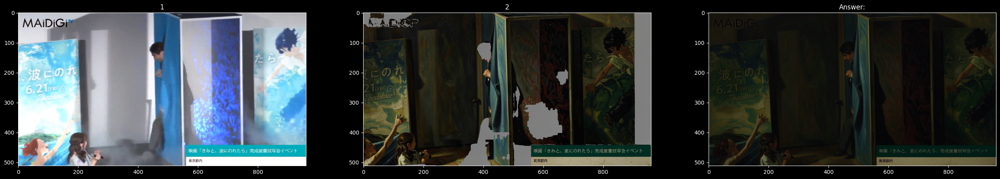

 12%|█▏        | 599/5000 [10:32<1:16:29,  1.04s/it]

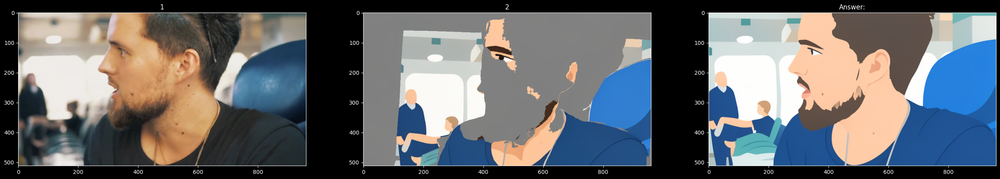

 14%|█▍        | 699/5000 [12:18<1:15:06,  1.05s/it]

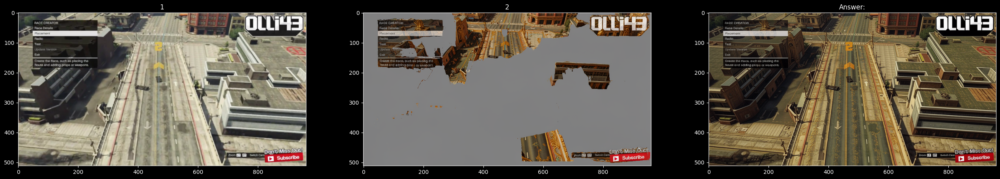

 16%|█▌        | 799/5000 [14:04<1:12:43,  1.04s/it]

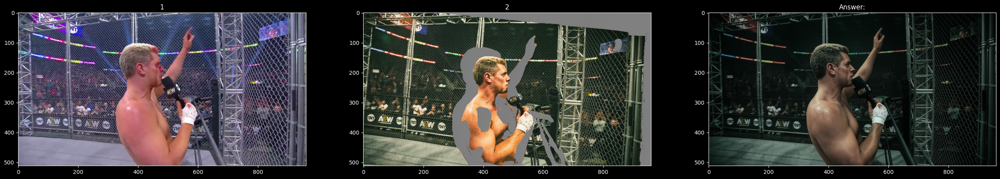

 18%|█▊        | 890/5000 [15:41<1:12:28,  1.06s/it]


KeyboardInterrupt: 

In [ ]:
from torch.utils.tensorboard import SummaryWriter

writer = SummaryWriter(log_dir="../../runs/flow_refractor/lora-3")

epochs = 1000
idx = 0


for epoch in range(0, epochs):
    num_steps = 0
    loss_sum = 0
    transformer.train()
    transformer.enable_gradient_checkpointing()
    for prompts, cond_A, cond_B, final_A, final_B, masked_B in tqdm(train_loader):
        num_steps += 1

        batch_size = cond_A.shape[0]

        cond_A = cond_A.to(device, dtype)
        cond_B = cond_B.to(device, dtype)
        final_A = final_A.to(device, dtype)
        final_B = final_B.to(device, dtype)

        final_B = patchify_latents(final_B)
        final_B = pack_latents(final_B)

        with torch.no_grad():
            generator = torch.Generator(device="cuda")

            latents, latent_ids = prepare_latents(
                batch_size=1,
                num_latents_channels=32,
                height=height,
                width=width,
                dtype=dtype,
                device=device,
                generator=generator,
            )

            image_latents, image_latent_ids = prepare_reference_latents(
                reference_latents=[cond_B, final_A],
                vae=vae,
                batch_size=1,
                device=device,
                dtype=dtype,
            )

            prompt_embeds, text_ids = encode_prompt(
                prompt=[instruct_prompt + prompts[0]],
                text_encoder=text_encoder,
                tokenizer=tokenizer,
                device=device,
                num_images_per_prompt=1,
                max_sequence_length=512,
                text_encoder_out_layers=(9, 18, 27),
            )

        sigmas = torch.rand(batch_size).to(device, dtype)

        noise = torch.normal(0, 1, final_B.shape).to(device, dtype)

        noisy_latents = final_B * (1 - sigmas) + noise * sigmas

        predicted_velocity = transformer(
            hidden_states=torch.cat([noisy_latents, image_latents], dim=1),
            timestep=sigmas,
            guidance=None,
            encoder_hidden_states=prompt_embeds,
            txt_ids=text_ids,
            img_ids=torch.cat([latent_ids, image_latent_ids], dim=1),
            return_dict=False,
        )[0]

        predicted_velocity = predicted_velocity[:, : latents.size(1), :]

        target = noise - final_B

        loss = ((target - predicted_velocity) ** 2).mean()

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        loss_sum += float(loss.item())

        if num_steps == 100:
            transformer.eval()
            test_model()
            transformer.train()
            writer.add_scalar("train_loss", loss_sum / num_steps, idx)
            idx += 1
            num_steps = 0
            loss_sum = 0

    # generate_test_sample(epoch_number=epoch)

    # torch.save(unet.state_dict(), "../../trained_models/autosave.pth")

In [31]:
transformer.save_pretrained("../../trained_loras/test-3")

In [ ]:
transformer.load_adapter("../../trained_loras/test-1", adapter_name="test-1")

In [ ]:
# torch.save(unet.state_dict(), "../../trained_models/flow_refractor/test-3.pth")
# state_dict = torch.load(
#    "../../trained_models/flow_refractor/test-3.pth", weights_only=True
# )
# unet.load_state_dict(state_dict)